In [1]:
import os
from functools import partial
from typing import Optional, Tuple

import numpy as np
import torch
from tensorboardX import SummaryWriter
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from ding.config import compile_config
from ding.envs import create_env_manager
from ding.envs import get_vec_env_setting
from ding.policy import create_policy
from ding.utils import set_pkg_seed
from ding.torch_utils import to_tensor, to_device, to_ndarray
from ding.worker import BaseLearner
from lzero.worker import MuZeroEvaluator
from lzero.policy import InverseScalarTransform, mz_network_output_unpack

from zoo.classic_control.mountain_car.config.mtcar_muzero_config import main_config, create_config
# from lzero.entry import eval_muzero
import numpy as np

from typing import Optional, Tuple, List

[01-26 01:12:14] WARNING  If you want to use numba to speed up segment tree, please install numba first                                              ]8;id=888279;file:///home/nighoodRen/DI-engine/ding/utils/default_helper.py\default_helper.py]8;;\:]8;id=927507;file:///home/nighoodRen/DI-engine/ding/utils/default_helper.py#441\441]8;;\

/home/nighoodRen/anaconda3/envs/DI-LZ/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
model_path = "/home/nighoodRen/lz_result/debug/mountain_car_muzero_ns25_upc100_rr0_seed0_240110_201124/ckpt/ckpt_best.pth.tar"
returns_mean_seeds = []
returns_seeds = []
seed = 0
num_episodes_each_seed = 1
total_test_episodes = num_episodes_each_seed
create_config.env_manager.type = 'base'  # Visualization requires the 'type' to be set as base
main_config.env.evaluator_env_num = 1  # Visualization requires the 'env_num' to be set as 1
main_config.env.n_evaluator_episode = total_test_episodes
main_config.env.replay_path = 'lz_result/video/mtcar_mz'
main_config.exp_name = f'lz_result/eval/muzero_eval_ls{main_config.policy.model.latent_state_dim}'

In [3]:
cfg, create_cfg = main_config, create_config
assert create_cfg.policy.type in ['efficientzero', 'muzero', 'stochastic_muzero', 'gumbel_muzero', 'sampled_efficientzero'], \
    "LightZero now only support the following algo.: 'efficientzero', 'muzero', 'stochastic_muzero', 'gumbel_muzero', 'sampled_efficientzero'"

if cfg.policy.cuda and torch.cuda.is_available():
    cfg.policy.device = 'cuda'
else:
    cfg.policy.device = 'cpu'

cfg = compile_config(cfg, seed=seed, env=None, auto=True, create_cfg=create_cfg, save_cfg=True)
# Create main components: env, policy
env_fn, collector_env_cfg, evaluator_env_cfg = get_vec_env_setting(cfg.env)
evaluator_env = create_env_manager(cfg.env.manager, [partial(env_fn, cfg=c) for c in evaluator_env_cfg])

evaluator_env.seed(cfg.seed, dynamic_seed=False)
set_pkg_seed(cfg.seed, use_cuda=cfg.policy.cuda)

policy = create_policy(cfg.policy, model=None, enable_field=['learn', 'collect', 'eval'])

# load pretrained model
if model_path is not None:
    policy.learn_mode.load_state_dict(torch.load(model_path, map_location=cfg.policy.device))

# Create worker components: learner, collector, evaluator, replay buffer, commander.
tb_logger = SummaryWriter(os.path.join('./{}/log/'.format(cfg.exp_name), 'serial'))
learner = BaseLearner(cfg.policy.learn.learner, policy.learn_mode, tb_logger, exp_name=cfg.exp_name)

# ==============================================================
# MCTS+RL algorithms related core code
# ==============================================================
policy_config = cfg.policy
evaluator = MuZeroEvaluator(
    eval_freq=cfg.policy.eval_freq,
    n_evaluator_episode=cfg.env.n_evaluator_episode,
    stop_value=cfg.env.stop_value,
    env=evaluator_env,
    policy=policy.eval_mode,
    tb_logger=tb_logger,
    exp_name=cfg.exp_name,
    policy_config=policy_config
)

# ==========
# Main loop
# ==========
# Learner's before_run hook.
learner.call_hook('before_run')

# 只进行一次eval
# ==============================================================
# eval trained model
# ==============================================================
# returns = []
# trajectorys = []
# for i in range(num_episodes_each_seed):
stop_flag, episode_info = evaluator.eval(learner.save_checkpoint, learner.train_iter, return_trajectory=True)
trajectorys = episode_info['trajectory']
returns = episode_info['eval_episode_return']
returns = np.array(returns)

/home/nighoodRen/anaconda3/envs/DI-LZ/lib/python3.8/site-packages/gym/spaces/box.py:128: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")


[01-26 01:12:19] INFO     [RANK0]: DI-engine DRL Policy                                                                                                ]8;id=271493;file:///home/nighoodRen/DI-engine/ding/worker/learner/base_learner.py\base_learner.py]8;;\:]8;id=536110;file:///home/nighoodRen/DI-engine/ding/worker/learner/base_learner.py#338\338]8;;\
                          MuZeroModelMLP(                                                                                                                                 
                            (representation_network): RepresentationNetworkMLP(                                                                                           
                              (fc_representation): Sequential(                                                                                                            
                                (0): Linear(in_features=2, out_features=64, bias=True)                                                                                    
                                (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)                                                      
                                (2): ReLU(inplace=True)                                                                                                                   
                                (3): Linear(in_features=64, out_features=64, bias=True)                                                                                   
                              )                                                                                                                                           
                            )                                                                                                                                             
                            (dynamics_network): DynamicsNetwork(                                                                                                          
                              (fc_dynamics_1): Sequential(                                                                                                                
                                (0): Linear(in_features=67, out_features=64, bias=True)                                                                                   
                                (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)                                                      
                                (2): ReLU(inplace=True)                                                                                                                   
                                (3): Linear(in_features=64, out_features=64, bias=True)                                                                                   
                                (4): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)                                                      
                                (5): ReLU(inplace=True)                                                                                                                   
                              )                                                                                                                                           
                              (fc_dynamics_2): Sequential(                                                                                                                
                                (0): Linear(in_features=64, out_features=64, bias=True)                                                                                   
                                (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)                                                      
                                (2): ReLU(inplace=

[01-26 01:12:19] INFO     Env Space Information:                                                                                                   ]8;id=499748;file:///home/nighoodRen/DI-engine/ding/envs/env_manager/base_env_manager.py\base_env_manager.py]8;;\:]8;id=375441;file:///home/nighoodRen/DI-engine/ding/envs/env_manager/base_env_manager.py#320\320]8;;\

[01-26 01:12:19] INFO             Observation Space: Box([-1.2  -0.07], [0.6  0.07], (2,), float32)                                                ]8;id=146039;file:///home/nighoodRen/DI-engine/ding/envs/env_manager/base_env_manager.py\base_env_manager.py]8;;\:]8;id=295528;file:///home/nighoodRen/DI-engine/ding/envs/env_manager/base_env_manager.py#321\321]8;;\

[01-26 01:12:19] INFO             Action Space: Discrete(3)                                                                                        ]8;id=262674;file:///home/nighoodRen/DI-engine/ding/envs/env_manager/base_env_manager.py\base_env_manager.py]8;;\:]8;id=953938;file:///home/nighoodRen/DI-engine/ding/envs/env_manager/base_env_manager.py#322\322]8;;\

[01-26 01:12:19] INFO             Reward Space: Box(-1.0, 0.0, (1,), float32)                                                                      ]8;id=154100;file:///home/nighoodRen/DI-engine/ding/envs/env_manager/base_env_manager.py\base_env_manager.py]8;;\:]8;id=325213;file:///home/nighoodRen/DI-engine/ding/envs/env_manager/base_env_manager.py#323\323]8;;\

/home/nighoodRen/anaconda3/envs/DI-LZ/lib/python3.8/site-packages/gym/core.py:329: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/nighoodRen/anaconda3/envs/DI-LZ/lib/python3.8/site-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/nighoodRen/anaconda3/envs/DI-LZ/lib/python3.8/site-packages/gym/core.py:268: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed)` instead.
  deprecation(


[01-26 01:12:24] INFO     [EVALUATOR]env 0 finish episode, final reward: -113.0, current episode: 1                                                ]8;id=346236;file:///home/nighoodRen/LightZero/lzero/worker/muzero_evaluator.py\muzero_evaluator.py]8;;\:]8;id=495077;file:///home/nighoodRen/LightZero/lzero/worker/muzero_evaluator.py#354\354]8;;\

[01-26 01:12:24] INFO                                                                                                                              ]8;id=640561;file:///home/nighoodRen/LightZero/lzero/worker/muzero_evaluator.py\muzero_evaluator.py]8;;\:]8;id=671532;file:///home/nighoodRen/LightZero/lzero/worker/muzero_evaluator.py#430\430]8;;\
                          +-------+------------+---------------------+---------------+---------------+                                                                    
                          | Name  | train_iter | ckpt_name           | episode_count | envstep_count |                                                                    
                          +-------+------------+---------------------+---------------+---------------+                                                                    
                          | Value | 0.000000   | iteration_0.pth.tar | 1.000000      | 113.000000    |                                                                    
                          +-------+------------+---------------------+---------------+---------------+                                                                    
                          +-------+-------------------------+---------------+---------------------+----------------------+                                                
                          | Name  | avg_envstep_per_episode | evaluate_time | avg_envstep_per_sec | avg_time_per_episode |                                                
                          +-------+-------------------------+---------------+---------------------+----------------------+                                                
                          | Value | 113.000000              | 5.530171      | 20.433363           | 0.180826             |                                                
                          +-------+-------------------------+---------------+---------------------+----------------------+                                                
                          +-------+-------------+------------+-------------+-------------+                                                                                
                          | Name  | reward_mean | reward_std | reward_max  | reward_min  |                                                                                
                          +-------+-------------+------------+-------------+-------------+                                                                                
                          | Value | -113.000000 | 0.000000   | -113.000000 | -113.000000 |                                                                                
                          +-------+-------------+------------+-------------+-------------+                                                                                
                          +-------+---------------------+--------------------------+                                                                                      
                          | Name  | eval_episode_return | eval_episode_return_mean |                                                                                      
                          +-------+---------------------+--------------------------+                                                                                      
                          | Value | [-113.0]            | -113.000000              |                                                                                      
                          +-------+---------------------+--------------------------+                                                                                      
                                                                                                                                                                          

[01-26 01:12:24] INFO     [RANK0]: learner save ckpt in ./lz_result/eval/muzero_eval_ls64_240126_011215/ckpt/ckpt_best.pth.tar                         ]8;id=464197;file:///home/nighoodRen/DI-engine/ding/worker/learner/base_learner.py\base_learner.py]8;;\:]8;id=907343;file:///home/nighoodRen/DI-engine/ding/worker/learner/base_learner.py#338\338]8;;\

# 原空间枚举

In [4]:
# 原空间枚举状态相关函数
def create_grid(v_mins: List, v_maxs: List, resolution: int) -> np.ndarray:
    data = list(map(lambda r: np.linspace(*r, resolution), zip(v_mins, v_maxs)))
    grid = np.asarray(np.meshgrid(*data, indexing="ij")).T.reshape(-1, len(v_mins))
    return grid

def get_state_space(env, resolution: int = 25) -> np.ndarray:
    obs_space = env.observation_space
    state_space = create_grid(obs_space.low, obs_space.high, resolution)
    return state_space


def embedding_manifold(state_space, model, return_pis: bool = False, policy_cfg = None) -> Tuple:
    with torch.no_grad():
        network_output = model.initial_inference(state_space)
    latent_state, reward, value, policy_logits = mz_network_output_unpack(network_output)
    inverse_scalar_transform_handler = InverseScalarTransform(
        policy_cfg.model.support_scale,
        policy_cfg.device,
        policy_cfg.model.categorical_distribution)
    value_real = inverse_scalar_transform_handler(value)

    if return_pis:
        return to_ndarray(latent_state.cpu()), to_ndarray(value_real.cpu()), to_ndarray(policy_logits.cpu())
    
    return to_ndarray(latent_state.cpu()), to_ndarray(value_real.cpu())

In [5]:
# 原空间枚举
delta = 250
state_space = get_state_space(evaluator_env, delta)
state_space_tensor = to_device(to_tensor(state_space), policy_config.device)
latent_state_space, v_state_space = embedding_manifold(state_space_tensor, policy._model, policy_cfg=policy_config)
print(state_space.shape, latent_state_space.shape)

(62500, 2) (62500, 64)


# t-SNE

In [8]:
# PCA相关函数
def embedding_TSNE(latent_states: np.ndarray, standardize: bool = False):   
    x = latent_states
    if standardize:
        x = (x - x.mean(axis=0)) / x.std(axis=0)
    
    # Perform TSNE on latent dimensions
    tsne = TSNE(n_components=3)
    tsne.fit(x)
    tsne_results = tsne.fit_transform(x)

    # Create 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(tsne_results[:, 0], tsne_results[:, 1], tsne_results[:, 2])
    
    ax.set_title(f"t-SNE on latent-states (standardize={standardize})")
    ax.set_xlabel("t-SNE Dimension 1")
    ax.set_ylabel("t-SNE Dimension 2")
    ax.set_zlabel("t-SNE Dimension 3")
    
    plt.show()
    
    return tsne

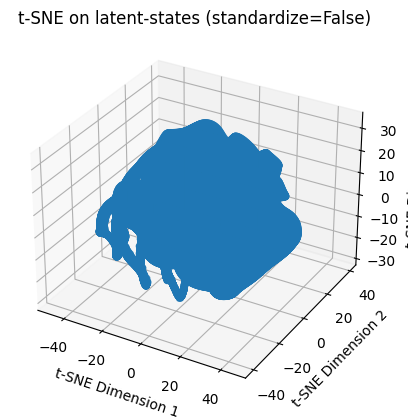

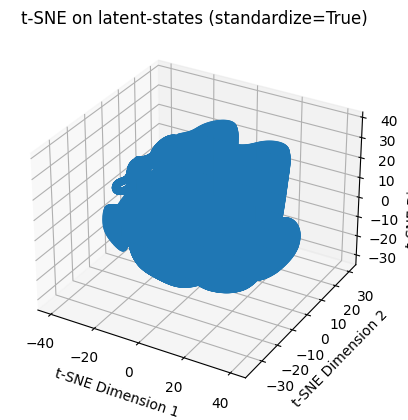

In [10]:
tsne = embedding_TSNE(latent_state_space, False)
tsne_norm = embedding_TSNE(latent_state_space, True)
tsne_latent_state_space = tsne.fit_transform(latent_state_space)
# 因为latent_state_dim=64，所以这里的统计图是正常的

# 原空间/TSNE latent state可视化

In [11]:
# 状态空间可视化
def to_grid(x: np.ndarray, delta: int) -> np.ndarray:
    return x.reshape(delta, delta)


def simple_PC_value_contour(pc_1: np.ndarray, pc_2: np.ndarray, z: np.ndarray) -> None:
    # 画 TSNE 后的 latent state
    plt.scatter(pc_1, pc_2, c=z, alpha=0.5, s=5, cmap='rainbow')

    cbar = plt.colorbar()
    cbar.set_label(r'$V_\theta(o_t)$')

    plt.title("Value Contour MuZero TSNE-Space")
    plt.ylabel(r"First TSNE component $h_\theta(o_t)$")
    plt.xlabel(r"Second TSNE component $h_\theta(o_t)$")


def simple_MC_value_contour(x: np.ndarray, y: np.ndarray, z: np.ndarray) -> None:
    # 画原始的 state
    # Simple Example Figure for a 2-d env
    plt.title("Value Contour MuZero MountainCar")
    plt.ylabel("Velocity")
    plt.xlabel("Position")

    plt.contourf(x, y, z, levels=100, cmap='rainbow')

    cbar = plt.colorbar()
    cbar.set_label(r'$V_\theta(o_t)$')

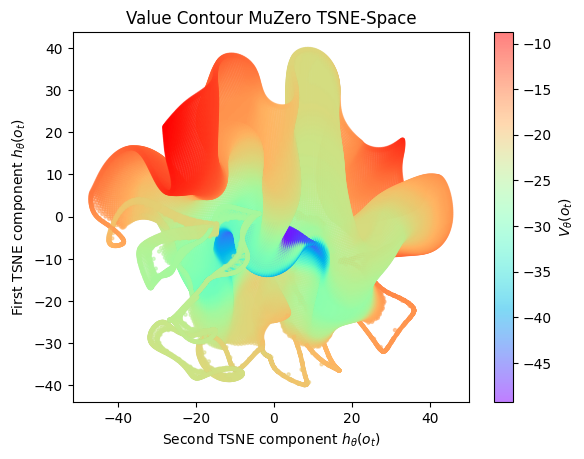

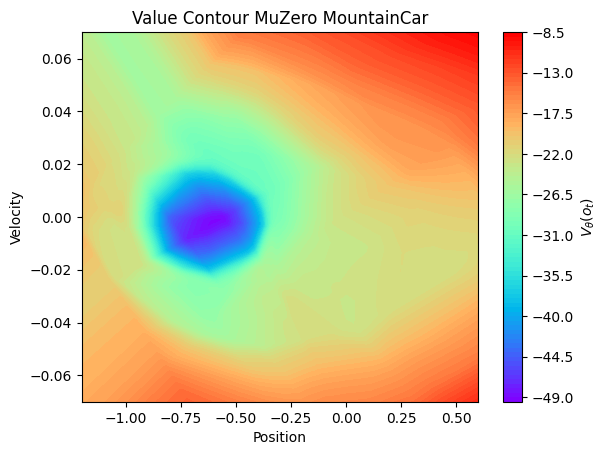

In [12]:
simple_PC_value_contour(tsne_latent_state_space[:, 0], tsne_latent_state_space[:, 1], v_state_space)
plt.show()
simple_MC_value_contour(to_grid(state_space[:,0], delta), to_grid(state_space[:,1], delta), to_grid(v_state_space, delta))
plt.show()

暂时图看起来没原来的好看，先按照现在的latent_state_dim=64，如果效果不好再改

# 获取eval的轨迹

In [13]:
# 游戏轨迹dynamics处理
def get_latent_trajectory(embeddings: torch.Tensor, actions: torch.Tensor, model) -> np.ndarray:
    latent_state = embeddings[0].unsqueeze(0)
    
    latent_states = list()
    latent_states.append(to_ndarray(latent_state.cpu()))
    with torch.no_grad():
        for i in range(len(actions)):
            
            network_output = model.recurrent_inference(latent_state, actions[i].unsqueeze(0))    # 这里action注意
            latent_state, reward, value, policy_logits = mz_network_output_unpack(network_output)
        
            # memory = latent_state
            latent_states.append(to_ndarray(latent_state.cpu()))

    stacked = np.concatenate(latent_states)
    return stacked

In [14]:
#   1 轨迹加载
real_state = np.array(trajectorys[0].obs_segment)
real_state_tensor = to_device(to_tensor(real_state), state_space_tensor.device)
actions = np.array(trajectorys[0].action_segment)
actions_tensor = to_device(to_tensor(actions).unsqueeze(1), state_space_tensor.device)
with torch.no_grad():
    network_output = policy._model.initial_inference(real_state_tensor)
latent_state_represent_tensor, reward, v_trajectorys_tensor, policy_logits = mz_network_output_unpack(network_output) 
latent_state_represent = to_ndarray(latent_state_represent_tensor.cpu())
v_trajectorys = to_ndarray(v_trajectorys_tensor.cpu())

#   2 获取latent state轨迹
latent_state_dynamics = get_latent_trajectory(latent_state_represent_tensor, actions_tensor, policy._model)

#   3 Project to PC-space
pc_embedding_trajectory = tsne.fit_transform(latent_state_represent.reshape(len(latent_state_represent), -1))
pc_dynamics_trajectory = tsne.fit_transform(latent_state_dynamics.reshape(len(latent_state_dynamics), -1))

# 观察分布

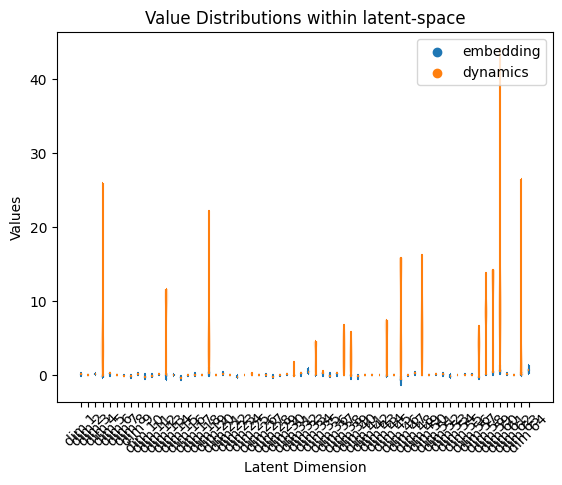

In [15]:
# 观察分布
#   1 latent state轨迹分布
plt.violinplot(latent_state_represent.reshape(len(latent_state_represent), -1), np.arange(1, latent_state_space.shape[-1] + 1))
plt.violinplot(latent_state_dynamics.reshape(len(latent_state_dynamics), -1), np.arange(1, latent_state_space.shape[-1] + 1))

plt.scatter([], [], label='embedding')
plt.scatter([], [], label='dynamics')

plt.title("Value Distributions within latent-space")

plt.ylabel("Values")
plt.xlabel("Latent Dimension")
plt.xticks(range(1, latent_state_space.shape[-1] + 1), [f'dim {i}' for i in range(1, latent_state_space.shape[-1] + 1)], rotation=45)

plt.legend()
plt.show()


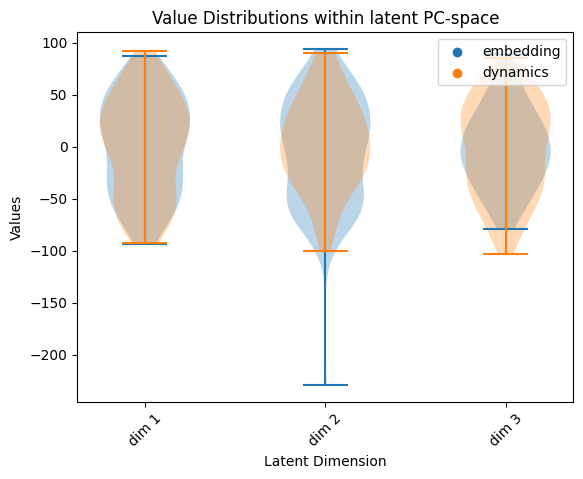

In [16]:
#   2 TSNE后的latent state轨迹分布
plt.violinplot(pc_embedding_trajectory, np.arange(1, 3 + 1))
plt.violinplot(pc_dynamics_trajectory, np.arange(1, 3 + 1))

plt.scatter([], [], label='embedding')
plt.scatter([], [], label='dynamics')

plt.title("Value Distributions within latent PC-space")

plt.ylabel("Values")
plt.xlabel("Latent Dimension")
plt.xticks(range(1, 3 + 1), [f'dim {i}' for i in range(1, 3 + 1)], rotation=45)

plt.legend()
plt.show()

# 3D轨迹可视化

In [17]:
def generate_3d_surface(x: np.ndarray, y: np.ndarray, z: np.ndarray, colors: np.ndarray, clim=None):
    return go.Surface(
        x=x, y=y, z=z,
        opacity=1, 
        surfacecolor=colors,
        colorscale='Viridis',
        cmin=colors.min() if clim is None else clim[0],
        cmax=colors.max() if clim is None else clim[1],
        colorbar=dict(title=dict(text='V',side='top'), thickness=50, tickmode='array')
    )

def generate_3d_trajectory(x: np.ndarray, y: np.ndarray, z: np.ndarray, color: str):
    return go.Scatter3d(
        x=x + np.random.rand()*0.01,
        y=y + np.random.rand()*0.01,
        z=z + np.random.rand()*0.01,
        mode='lines+markers',
        marker=dict(
            size=3,
            symbol='x',
            color=color,
            opacity=1
        ),
        line=dict(
            color=color,
            width=20
        )
    )

def generate_3d_valuefield(x: np.ndarray, y: np.ndarray, z: np.ndarray, colors: np.ndarray, clim=None):
    return go.Scatter3d(
        x=x, y=y, z=z,
        mode='markers',
        marker=dict(
            size=4,
            color=colors,
            colorscale='Viridis',
            cmin=colors.min() if clim is None else clim[0],
            cmax=colors.max() if clim is None else clim[1],
            opacity=1,
            colorbar=dict(title=dict(text='V',side='top'), thickness=50, tickmode='array')
        ),
    )

In [18]:
# 3D轨迹可视化
x = 3
dynamics_trajectory =  generate_3d_trajectory(
    pc_dynamics_trajectory[:, 0].ravel(),
    pc_dynamics_trajectory[:, 1].ravel(), 
    pc_dynamics_trajectory[:, 2].ravel(), 'grey')

embedding_trajectory = generate_3d_trajectory(
    pc_embedding_trajectory[:, 0].ravel(), 
    pc_embedding_trajectory[:, 1].ravel(), 
    pc_embedding_trajectory[:, 2].ravel(), 'black')

surface = generate_3d_valuefield(tsne_latent_state_space[:,0], tsne_latent_state_space[:,1], tsne_latent_state_space[:,2], v_state_space)

fig = go.Figure(data=[embedding_trajectory, dynamics_trajectory, surface])
# 
# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))

fig.show()